In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import time

In [9]:
df = pd.read_csv("../data/data.csv")

In [10]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [17]:
df_feat = df.iloc[:,1:-1]

In [18]:
df_feat = df_feat.drop(['diagnosis'],axis=1)

In [19]:
df_feat_ = df_feat.head(10)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [14]:
df_feat.dropna(axis=1, inplace=True)

In [15]:
from causalnex.structure.notears import from_pandas
from causalnex.structure import StructureModel

In [ ]:
%%time
SM = from_pandas(df_feat)

In [9]:
import networkx as nx

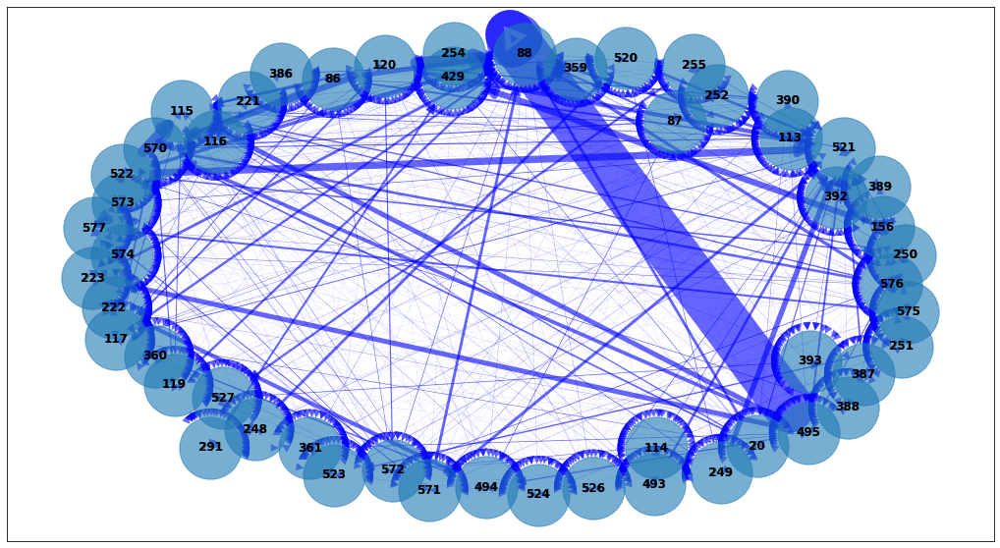

In [10]:
plt.figure(figsize=(18,10))
pos = nx.spring_layout(SM, k=60)
 
edge_width = [ d['weight']*0.3 for (u,v,d) in SM.edges(data=True)]
#nx.draw_networkx_labels(SM, pos, fontsize=16, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx_labels(SM, pos, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx(SM,
                 pos,
                 node_size=4000,
                 arrowsize=20,
                 alpha=0.6,
                 edge_color='b',
                 width=edge_width)

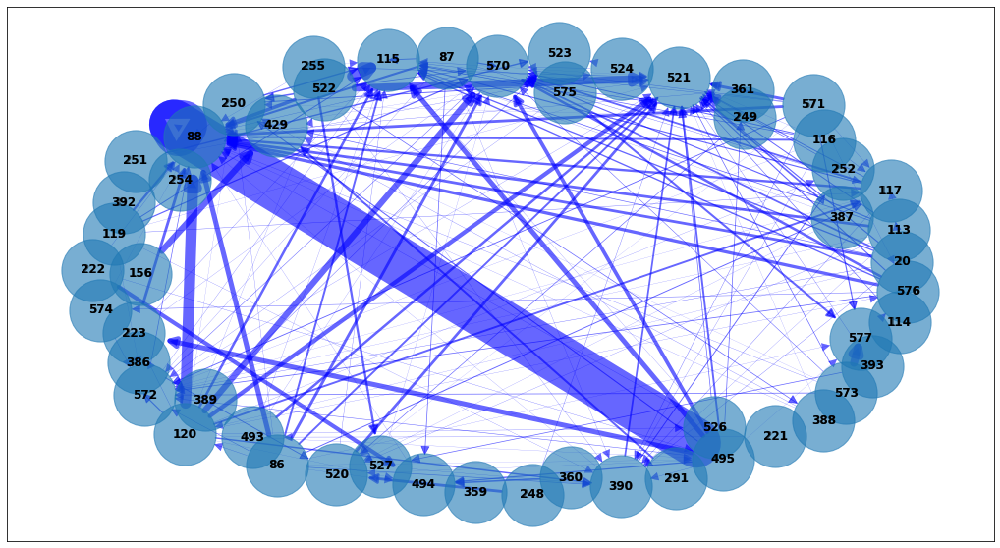

In [11]:
COPY_SM = SM.copy()
 
COPY_SM.remove_edges_below_threshold(0.5)
 
plt.figure(figsize=(18,10))
pos = nx.spring_layout(COPY_SM, k=60)
 
edge_width = [ d['weight']*0.3 for (u,v,d) in COPY_SM.edges(data=True)]
#nx.draw_networkx_labels(COPY_SM, pos, fontsize=16, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx_labels(COPY_SM, pos, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx(COPY_SM,
                 pos,
                 node_size=4000,
                 arrowsize=20,
                 alpha=0.6,
                 edge_color='b',
                 width=edge_width)

# Data test

In [12]:
df_feat

,20,86,87,88,113,114,115,116,117,119,...,526,527,570,571,572,573,574,575,576,577
0,1.4026,2.3895,0.9690,1747.6049,0.9460,0.0,748.6115,0.9908,58.4306,0.9804,...,0.5064,6.6926,533.8500,2.1113,8.95,0.3157,3.0624,0.1026,1.6765,14.9509
1,1.3825,2.3754,0.9894,1931.6464,0.9425,0.0,731.2517,0.9902,58.6680,0.9731,...,0.8832,8.8370,535.0164,2.4335,5.92,0.2653,2.0111,0.0772,1.1065,10.9003
2,1.4123,2.4532,0.9880,1685.8514,0.9231,0.0,718.5777,0.9899,58.4808,0.9772,...,0.6451,6.4568,535.0245,2.0293,11.21,0.1882,4.0923,0.0640,2.0952,9.2721
3,1.4011,2.4004,0.9904,1752.0968,0.9564,0.0,709.0867,0.9906,58.6635,0.9761,...,0.7404,6.4865,530.5682,2.0253,9.33,0.1738,2.8971,0.0525,1.7585,8.5831
4,1.3888,2.4530,0.9902,1828.3846,0.9424,0.0,796.5950,0.9908,58.3858,0.9628,...,2.2181,6.3745,532.0155,2.0275,8.83,0.2224,3.1776,0.0706,1.6597,10.9698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,1.4072,2.3762,0.9861,1869.4215,0.9520,0.0,727.6761,0.9894,58.3514,0.9636,...,1.2587,2.6649,536.3418,2.0153,7.98,0.2363,2.6401,0.0785,1.4879,11.7256
1563,1.3949,2.4880,0.9911,1872.5133,0.9561,0.0,755.7527,0.9899,57.1020,0.9806,...,0.4512,6.0192,537.9264,2.1814,5.48,0.3891,1.9077,0.1213,1.0187,17.8379
1564,1.4256,2.4590,0.9869,1820.3629,0.9488,0.0,704.2686,0.9891,59.2046,0.9767,...,0.4867,5.4641,530.3709,2.3435,6.49,0.4154,2.1760,0.1352,1.2237,17.7267
1565,1.3868,2.3600,0.9796,1627.4714,0.9485,0.0,605.6190,0.9896,58.2686,0.9805,...,0.3866,6.5512,534.3936,1.9098,9.13,0.3669,3.2524,0.1040,1.7085,19.2104


In [13]:
import warnings
warnings.filterwarnings("ignore")

In [14]:
# create instance
sm = StructureModel()

In [15]:
# define previous relation
sm.add_edges_from([
    ('20', '86'),
    ('20', '87')
])

In [16]:
# check the dag
sm.edges

OutEdgeView([('20', '86'), ('20', '87')])

In [17]:
!pip install --upgrade pip

     |████████████████████████████████| 1.5 MB 1.3 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 20.3.1
    Uninstalling pip-20.3.1:
      Successfully uninstalled pip-20.3.1


In [18]:
!conda install -y graphviz pygraphviz

Solving environment: \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - done

## Package Plan ##

  environment location: /opt/conda

  added / updated specs:
    - graphviz
    - pygraphviz


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    pygraphviz-1.6             |   py37h04d21ab_1         116 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         116 KB

The following NEW packages will be INSTALLED:

  pygraphviz         conda

In [19]:
import pygraphviz

In [20]:
from IPython.display import Image
from causalnex.plots import plot_structure, NODE_STYLE, EDGE_STYLE

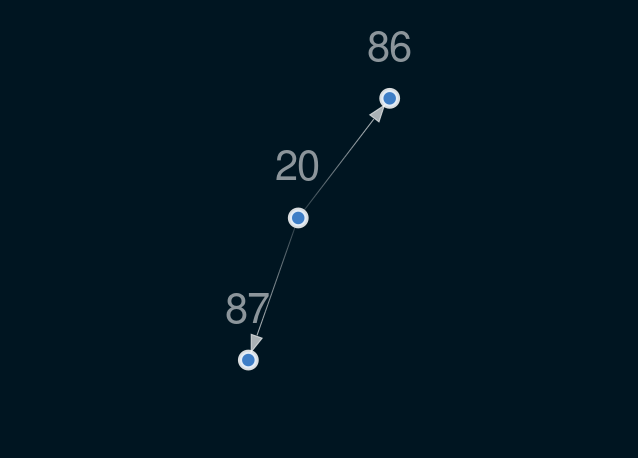

In [21]:
viz = plot_structure(
    sm,
    graph_attributes={"scale":"0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format="png"))

In [22]:
SM

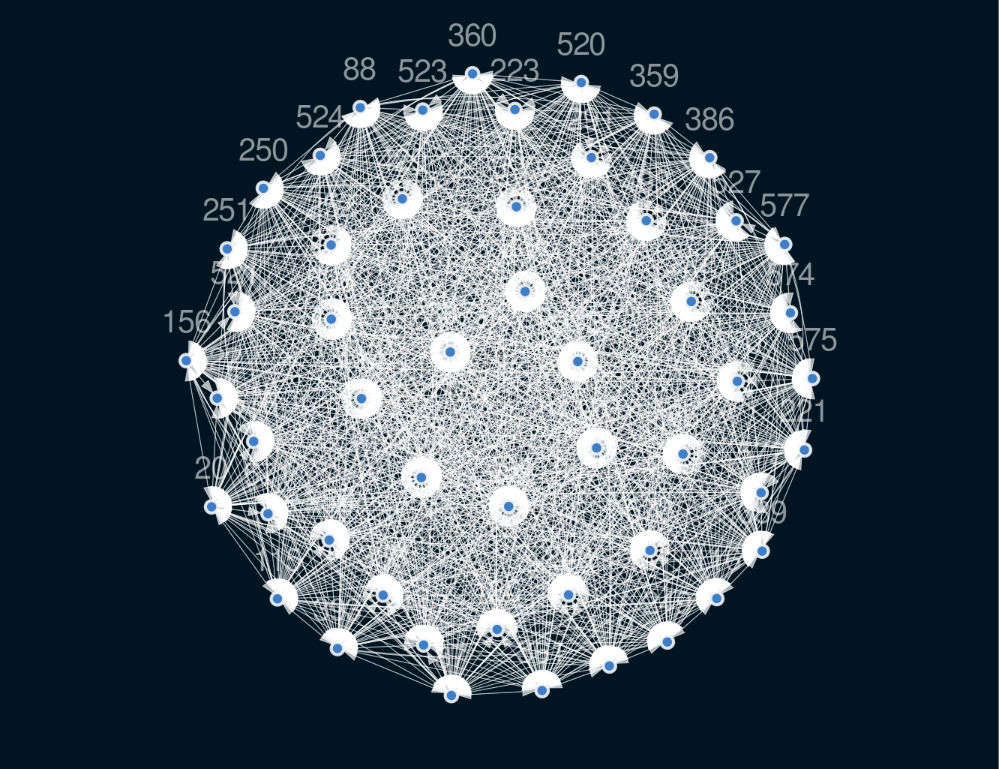

In [23]:
viz = plot_structure(
    SM,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [24]:
# remove weak network
SM.remove_edges_below_threshold(0.8)

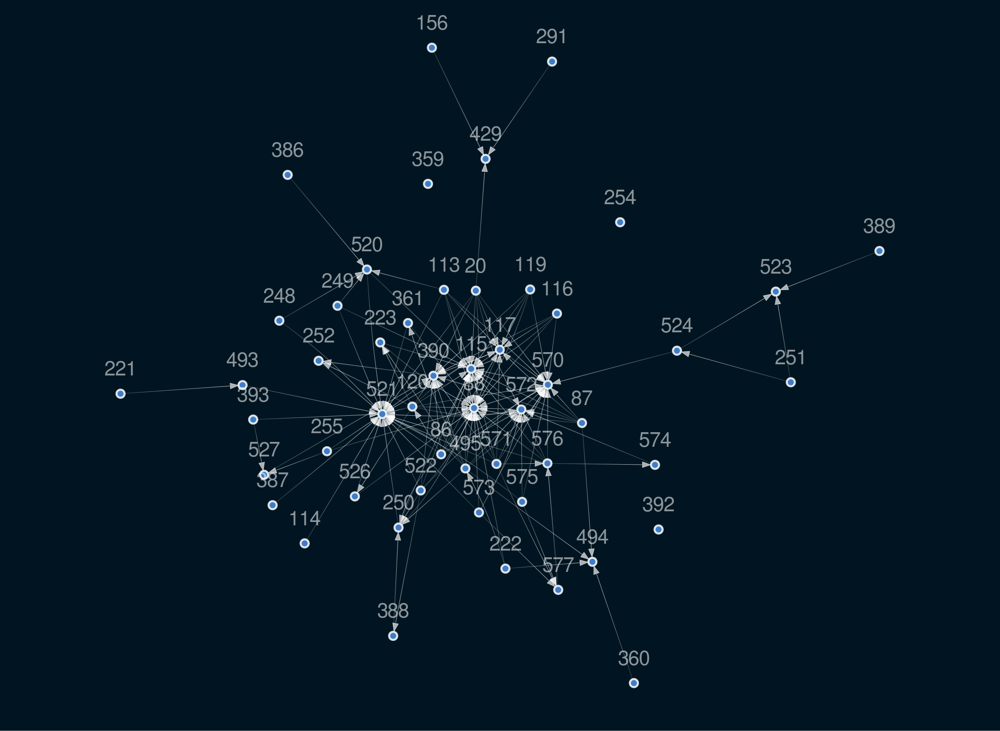

In [25]:
viz = plot_structure(
    SM,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [26]:
%%time
# Drop mistake conection from speciality knowlege
SM = from_pandas(df_feat, tabu_edges=[("250", "388"),("251","524")], w_threshold=0.8)

CPU times: user 36min 59s, sys: 21.9 s, total: 37min 21s
Wall time: 18min 42s


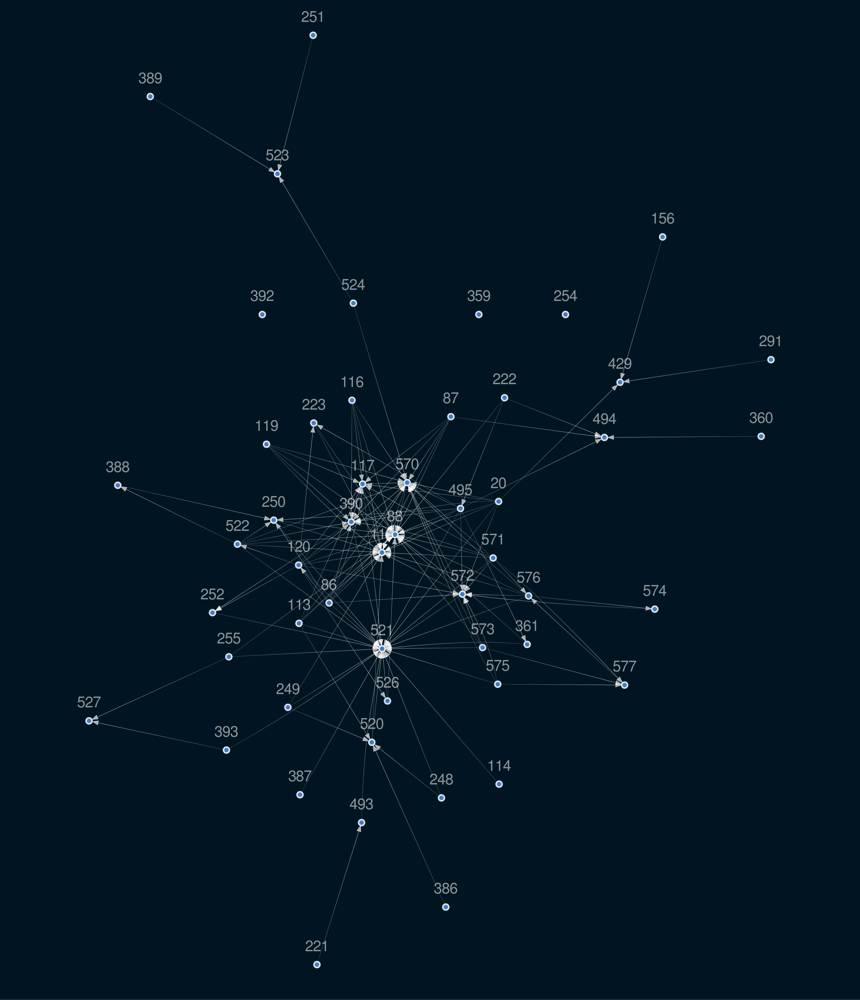

In [27]:
viz = plot_structure(
    SM,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [28]:
# lagrgest network
SM = SM.get_largest_subgraph()

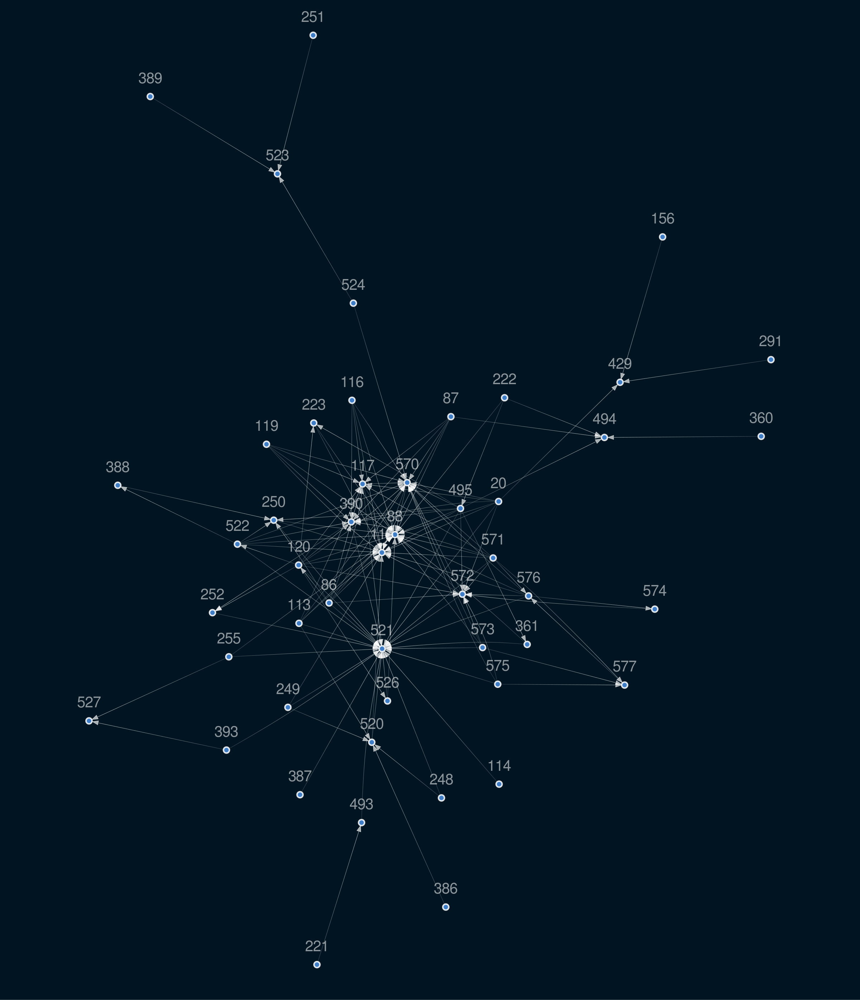

In [29]:
viz = plot_structure(
    SM,
    graph_attributes={"scale": "0.5"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [30]:
# create bayesian network instance
from causalnex.network import BayesianNetwork

bn = BayesianNetwork(SM)

In [31]:
# Bayesian Networks in CausalNex support only discrete distributions.
# So change to continuous value to discrete values and distributions

col = df_feat.columns
col

Index(['20', '86', '87', '88', '113', '114', '115', '116', '117', '119', '120',
       '156', '221', '222', '223', '248', '249', '250', '251', '252', '254',
       '255', '291', '359', '360', '361', '386', '387', '388', '389', '390',
       '392', '393', '429', '493', '494', '495', '520', '521', '522', '523',
       '524', '526', '527', '570', '571', '572', '573', '574', '575', '576',
       '577'],
      dtype='object')

In [32]:
# library for make dsicrete value
from causalnex.discretiser import Discretiser

df_c = df_feat.copy()

for i in range(len(col)):
    c = col[i]
    df_c[c] = Discretiser(method="fixed",
                          numeric_split_points=[df_c[c].quantile(0.5)]).transform(df_c[c].values)

In [33]:
df_c

,20,86,87,88,113,114,115,116,117,119,...,526,527,570,571,572,573,574,575,576,577
0,0,0,0,0,0,1,0,1,0,1,...,0,1,1,0,1,1,1,1,1,1
1,0,0,1,1,0,1,0,0,1,1,...,0,1,1,1,0,0,0,0,0,0
2,1,1,1,0,0,1,0,0,0,1,...,0,1,1,0,1,0,1,0,1,0
3,0,0,1,0,1,1,0,1,1,1,...,0,1,0,0,1,0,0,0,1,0
4,0,1,1,1,0,1,1,1,0,0,...,1,0,0,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,1,0,0,1,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1563,0,1,1,1,1,1,1,0,0,1,...,0,0,1,1,0,1,0,1,0,1
1564,1,1,0,1,1,1,0,0,1,1,...,0,0,0,1,0,1,0,1,0,1
1565,0,0,0,0,1,1,0,0,0,1,...,0,1,1,0,1,1,1,1,1,1


In [34]:
df_feat

,20,86,87,88,113,114,115,116,117,119,...,526,527,570,571,572,573,574,575,576,577
0,1.4026,2.3895,0.9690,1747.6049,0.9460,0.0,748.6115,0.9908,58.4306,0.9804,...,0.5064,6.6926,533.8500,2.1113,8.95,0.3157,3.0624,0.1026,1.6765,14.9509
1,1.3825,2.3754,0.9894,1931.6464,0.9425,0.0,731.2517,0.9902,58.6680,0.9731,...,0.8832,8.8370,535.0164,2.4335,5.92,0.2653,2.0111,0.0772,1.1065,10.9003
2,1.4123,2.4532,0.9880,1685.8514,0.9231,0.0,718.5777,0.9899,58.4808,0.9772,...,0.6451,6.4568,535.0245,2.0293,11.21,0.1882,4.0923,0.0640,2.0952,9.2721
3,1.4011,2.4004,0.9904,1752.0968,0.9564,0.0,709.0867,0.9906,58.6635,0.9761,...,0.7404,6.4865,530.5682,2.0253,9.33,0.1738,2.8971,0.0525,1.7585,8.5831
4,1.3888,2.4530,0.9902,1828.3846,0.9424,0.0,796.5950,0.9908,58.3858,0.9628,...,2.2181,6.3745,532.0155,2.0275,8.83,0.2224,3.1776,0.0706,1.6597,10.9698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,1.4072,2.3762,0.9861,1869.4215,0.9520,0.0,727.6761,0.9894,58.3514,0.9636,...,1.2587,2.6649,536.3418,2.0153,7.98,0.2363,2.6401,0.0785,1.4879,11.7256
1563,1.3949,2.4880,0.9911,1872.5133,0.9561,0.0,755.7527,0.9899,57.1020,0.9806,...,0.4512,6.0192,537.9264,2.1814,5.48,0.3891,1.9077,0.1213,1.0187,17.8379
1564,1.4256,2.4590,0.9869,1820.3629,0.9488,0.0,704.2686,0.9891,59.2046,0.9767,...,0.4867,5.4641,530.3709,2.3435,6.49,0.4154,2.1760,0.1352,1.2237,17.7267
1565,1.3868,2.3600,0.9796,1627.4714,0.9485,0.0,605.6190,0.9896,58.2686,0.9805,...,0.3866,6.5512,534.3936,1.9098,9.13,0.3669,3.2524,0.1040,1.7085,19.2104


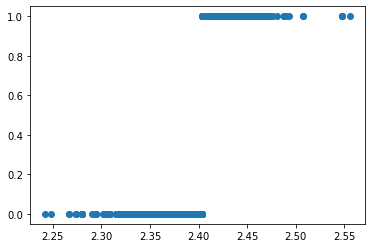

In [35]:
plt.scatter(df_feat["86"], df_c["86"])

In [36]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(df_c, train_size=0.9, test_size=0.1, random_state=7)

In [37]:
# 1st, The first step in this is specifying all of the states that each node can take.
bn = bn.fit_node_states(df_c)

In [38]:
%%time
# fit to train data
bn = bn.fit_cpds(train, method="BayesianEstimator", bayes_prior="K2")

CPU times: user 9min 5s, sys: 9.41 s, total: 9min 15s
Wall time: 9min 15s


In [39]:
# upper condition
# lower Conditional probability
bn.cpds["527"]

255         0              1          
393         0         1    0         1
527                                   
0    0.992614  0.833333  0.2  0.011747
1    0.007386  0.166667  0.8  0.988253

In [40]:
bn.cpds["390"]

116    0                                                               ...  \
117    0                                                               ...   
119    0                                                               ...   
120    0                                                               ...   
20     0                                                               ...   
495    0                                                               ...   
522    0                                                       1       ...   
571    0                             1                         0       ...   
86     0         1                   0               1         0       ...   
87     0    1    0         1         0         1     0    1    0    1  ...   
390                                                                    ...   
0    0.5  0.5  0.4  0.666667  0.333333  0.333333  0.25  0.5  0.5  0.5  ...   
1    0.5  0.5  0.6  0.333333  0.666667  0.666667  0.75  0.5  0.5  0.5  ...   

116    1                                                                
117    1                                                                
119    1                                                                
120    1                                                                
20     1                                                                
495    1                                                                
522    0          1                                                     
571    1          0                                   1                 
86     1          0                   1               0         1       
87     0    1     0         1         0     1         0    1    0    1  
390                                                                     
0    0.5  0.5  0.75  0.333333  0.666667  0.25  0.333333  0.5  0.5  0.5  
1    0.5  0.5  0.25  0.666667  0.333333  0.75  0.666667  0.5  0.5  0.5  

[2 rows x 1024 columns]

In [41]:
# prediction
predictions = bn.predict(test, "527")

In [42]:
predictions

,527_prediction
210,1
397,1
816,1
71,1
698,1
...,...
1549,0
23,0
684,1
1117,0


In [43]:
test["527"]

210     1
397     1
816     1
71      1
698     1
       ..
1549    0
23      0
684     1
1117    0
974     0
Name: 527, Length: 157, dtype: int64

In [44]:
# accuracy score etc.
from causalnex.evaluation import classification_report
classification_report(bn, test, "527")

{'527_0': {'precision': 0.9375,
  'recall': 0.9868421052631579,
  'f1-score': 0.9615384615384615,
  'support': 76},
 '527_1': {'precision': 0.987012987012987,
  'recall': 0.9382716049382716,
  'f1-score': 0.9620253164556961,
  'support': 81},
 'accuracy': 0.9617834394904459,
 'macro avg': {'precision': 0.9622564935064934,
  'recall': 0.9625568551007146,
  'f1-score': 0.9617818889970788,
  'support': 157},
 'weighted avg': {'precision': 0.963044916866573,
  'recall': 0.9617834394904459,
  'f1-score': 0.9617896414639138,
  'support': 157}}

In [45]:
from causalnex.evaluation import roc_auc
roc, auc = roc_auc(bn, test, "527")
print(auc)

0.9703030548906649


# various images

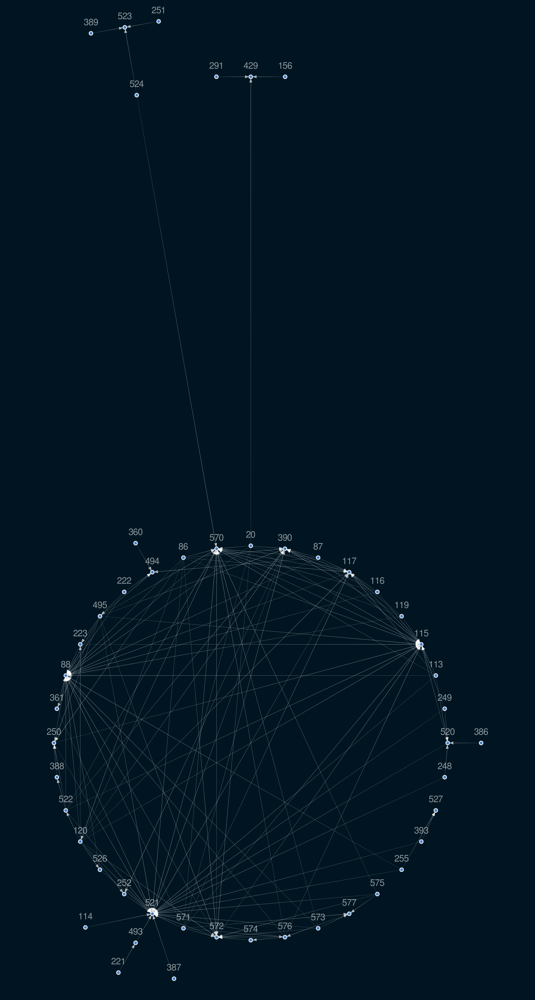

In [46]:
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

dot: Order nodes hierarchly. Great to spot the dependencies of a causal network.


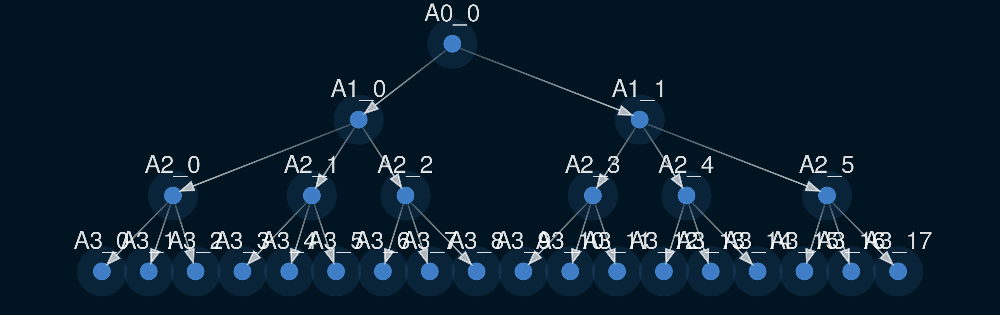

neato: Spring model. Great default tool if the graph is not too large


sfdp: A different style of spring model


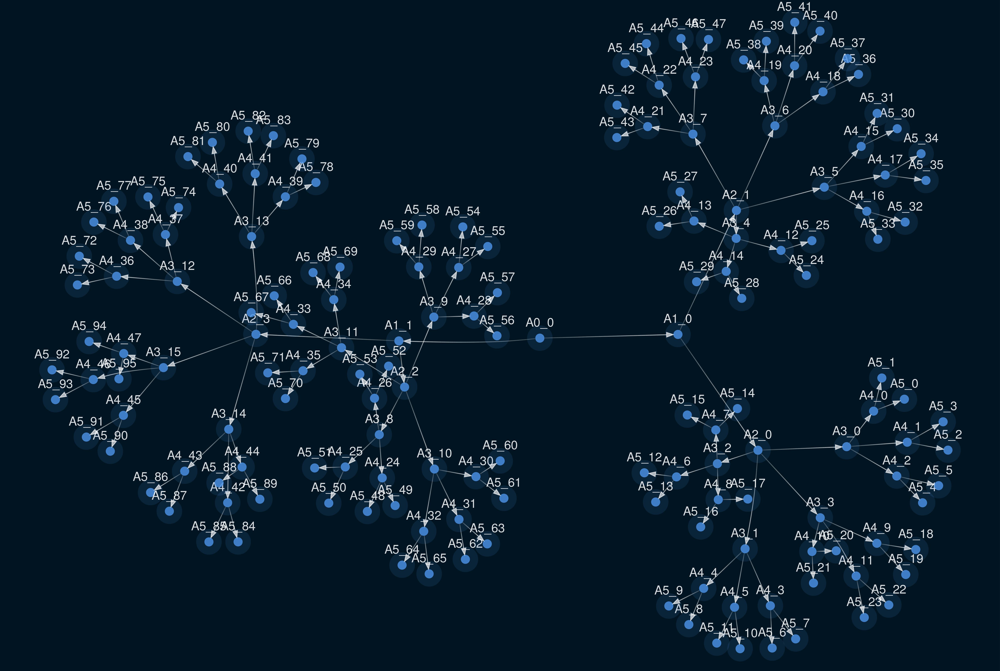

twopi: Radial layout


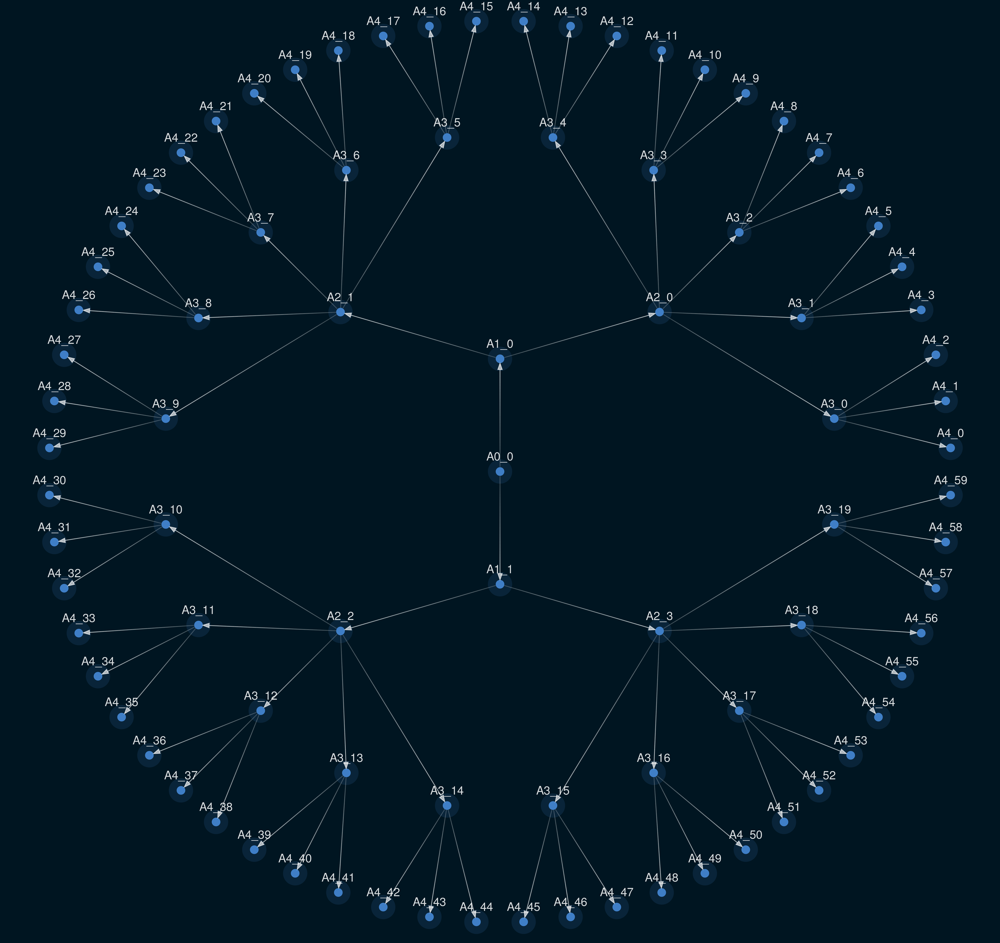

In [47]:
def get_tree(k_list):
    """
    Return the edges of a tree given the number of children at each level
    """
    n = 1
    edges_radial = []
    for level in range(0, len(k_list)):
        k = k_list[level]
        edges_radial.extend(
            [(f"A{level}_{i // k}", f"A{level + 1}_{i}") for i in range(k * n)]
        )
        n = k * n
    return edges_radial


layouts = [
    ("dot","Order nodes hierarchly. Great to spot the dependencies of a causal network.",[2, 3, 3]),
    ("neato", "Spring model. Great default tool if the graph is not too large", [2, 2, 4, 3, 2]),
    ("sfdp", "A different style of spring model", [2, 2, 4, 3, 2]),
    ("twopi", "Radial layout", [2, 2, 5, 3]),
]

for layout, description, k_list in layouts:
    g_tree = StructureModel(get_tree(k_list))
    viz = plot_structure(g_tree)

    print(f"{layout}: {description}")
    image_binary = viz.draw(format="png", prog=layout)
    display(Image(image_binary, width=500))

In [48]:
graph_attributes = {
    "splines": "spline",  # I use splies so that we have no overlap
    "ordering": "out",
    "ratio": "fill",  # This is necessary to control the size of the image
    "size": "16,9!",  # Set the size of the final image. (this is a typical presentation size)
    "label": "The structure of our\n \t Insurance model",
    "fontcolor": "#FFFFFFD9",
    "fontname": "Helvetica",
    "fontsize": 100,
    "labeljust": "l",
    "labelloc": "t",
    "pad": "1,1",
    "dpi": 200,
    "nodesep": 0.8,
    "ranksep": ".5 equally",
}

# Making all nodes hexagonal with black coloring
node_attributes = {
    node: {
        "shape": "hexagon",
        "width": 2.2,
        "height": 2,
        "fillcolor": "#000000",
        "penwidth": "10",
        "color": "#4a90e2d9",
        "fontsize": 35,
        "labelloc": "c",
    }
    for node in SM.nodes
}

# Splitting two words with "\n"
for node in SM.nodes:
    up_idx = [i for i, c in enumerate(node) if c.isupper()][-1]
    node_attributes[node]["label"] = node[:up_idx] + "\n" + node[up_idx:]

# Target nodes (ones with "Cost" in the name) are colored differently
for node in SM.nodes:
    if "Cost" in node:  # We color nodes with "cost" in the name with a orange colour.
        node_attributes[node]["fillcolor"] = "#DF5F00"

# Customising edges
edge_attributes = {
    (u, v): {
        "penwidth": w * 20 + 2,  # Setting edge thickness
        "weight": int(5 * w),  # Higher "weight"s mean shorter edges
        "arrowsize": 2 - 2.0 * w,  # Avoid too large arrows
        "arrowtail": "dot",
    }
    for u, v, w in SM.edges(data="weight")
}


viz = plot_structure(
    SM,
    prog="dot",
    graph_attributes=graph_attributes,
    node_attributes=node_attributes,
    edge_attributes=edge_attributes,
)
f = "supporting_files/final_insurance_model.jpg"
viz.draw(f)
Image(f)

IndexError: list index out of range